# Reading data from chromosome 26

This notebook demonstrates how to read data from *TreeSequence* objects and 
perform some basic statistics on the data. We will use the chromosome 26 data 
from the SMARTER background dataset, calculated with the *compara* approach

* [Displaying data](#displaying-data)
* [One-way statistics](#one-way-statistics)
* [Multi-way statistics](#multi-way-statistics)

In [1]:
import tskit
import tsinfer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tskitetude import get_project_dir

loading data from one chromosome:

In [2]:
ts = tskit.load(get_project_dir() / "results-compara/background_samples/tsinfer/SMARTER-OA-OAR3-forward-0.4.10.focal.26.trees")
ts

In [3]:
samples = tsinfer.load(get_project_dir() / "results-compara/background_samples/tsinfer/SMARTER-OA-OAR3-forward-0.4.10.focal.26.samples")
print(samples.info)

Name        : /
Type        : zarr.hierarchy.Group
Read-only   : True
Store type  : zarr.storage.LMDBStore
No. members : 5
No. arrays  : 0
No. groups  : 5
Groups      : individuals, populations, provenances, samples, sites
--------------------------------------------------------------------------------
Name               : /individuals/flags
Type               : zarr.core.Array
Data type          : uint32
Shape              : (5739,)
Chunk shape        : (1024,)
Order              : C
Read-only          : True
Compressor         : Zstd(level=1)
Store type         : zarr.storage.LMDBStore
No. bytes          : 22956 (22.4K)
No. bytes stored   : 389
Storage ratio      : 59.0
Chunks initialized : 6/6
--------------------------------------------------------------------------------
Name               : /individuals/location
Type               : zarr.core.Array
Data type          : object
Shape              : (5739,)
Chunk shape        : (1024,)
Order              : C
Read-only          : Tru

<a id="displaying-data"></a>
## Displaying data
The first thing I see that was different from tutorial is that the first tree looks a lot different from the second:

In [4]:
first = ts.first()
second = ts.at_index(1)

In [5]:
first

In [6]:
second

Try to modify [visualization tutorial](https://tskit.dev/tutorials/viz.html#larger-tree-sequences) to display the second tree:

In [7]:
x_limits = [int(second.interval[0]), int(second.interval[1])]

# Create evenly-spaced y tick positions to avoid overlap
# y_tick_pos = [0, 1000, 2000, 3000, 4000]
y_tick_pos = np.linspace(0, second.span, num=int(second.span / 10_000))

print("The tree sequence between positions {} and {} ...".format(*x_limits))

# this is a single tree, not a tree sequence (see: https://tskit.dev/tskit/docs/stable/python-api.html#tskit.Tree.draw_svg)
display(
    second.draw_svg(
        y_axis=True,
        y_ticks=y_tick_pos,
        size=(1024, 768),
        time_scale="log_time",
    )
)

The tree sequence between positions 209049 and 268822 ...


In [8]:
print("A larger tree, on a log timescale")
wide_fmt = (250000, 2000)

# Create a stylesheet that shrinks labels and rotates leaf labels, to avoid overlap
node_label_style = (
    ".node > .lab {font-size: 80%}"
    ".leaf > .lab {text-anchor: start; transform: rotate(90deg) translate(6px)}"
)
second.draw_svg(
    size=wide_fmt,
    time_scale="log_time",
    y_gridlines=True,
    y_axis=True,
    y_ticks=[1, 10, 100, 1000],
    style=node_label_style,
)

A larger tree, on a log timescale


### site-frequency spectrum

Calculate site-frequency spectrum:

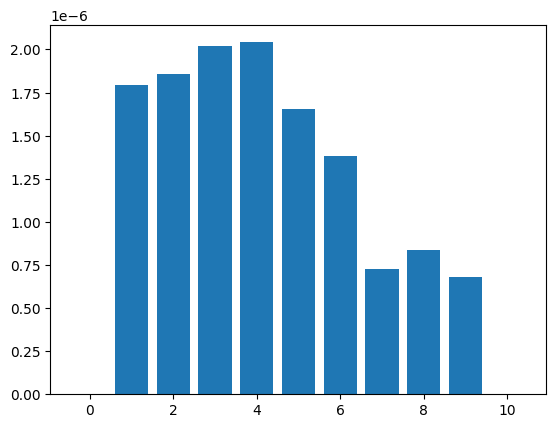

In [9]:
plt.bar(np.array(range(11)), ts.simplify(range(10)).allele_frequency_spectrum(polarised=True, span_normalise=True))
plt.show()

<a id='one-way-statistics'></a>
## One-way statistics
We refer to statistics that are defined with respect to a single set of samples as “one-way”. An example of such a statistic is diversity, which is computed using the [TreeSequence.diversity()](https://tskit.dev/tskit/docs/stable/python-api.html#tskit.TreeSequence.diversity) method:

In [10]:
pi = ts.diversity()
print(f"Average diversity per unit sequence length = {pi:.3G}")


Average diversity per unit sequence length = 5.96E-06


Computes mean genetic diversity (also known as `pi`) in each of the sets of nodes from sample_sets. The statistic is also known as *sample heterozygosity*; a common citation for the definition is [Nei and Li (1979)](https://doi.org/10.1073/pnas.76.10.5269) (equation 22), so it is sometimes called called “Nei’s pi” (but also sometimes “Tajima’s pi”). This tells the average diversity across the whole sequence and returns a single number. We’ll usually want to compute statistics in [windows](https://tskit.dev/tskit/docs/stable/stats.html#sec-stats-windows) along the genome and we use the windows argument to do this:

In [11]:
print("Sequence length = ", ts.sequence_length)
# windows = np.linspace(0, ts.sequence_length, num=int(ts.sequence_length / 1_000_000) + 1)
# it's seems that windows needs to contain the initial and final positions
windows = np.append(np.arange(0, ts.sequence_length, 5_000_000), ts.sequence_length)
# transform into integer
windows = windows.astype(int)
pi = ts.diversity(windows=windows)
df = pd.DataFrame({"windows": windows[1:], "pi": pi})
df["pi"] = df["pi"].map(lambda x: f"{x:.3G}")
df

Sequence length =  44077779.0


,windows,pi
0,5000000,6.08E-06
1,10000000,5.5E-06
2,15000000,5.55E-06
3,20000000,5.94E-06
4,25000000,6E-06
5,30000000,6.54E-06
6,35000000,5.27E-06
7,40000000,6.08E-06
8,44077779,6.86E-06


Suppose we wanted to compute diversity within a specific subset of samples. We can do this using the `sample_sets` argument:

In [12]:
A = ts.samples()[:100]
d = ts.diversity(sample_sets=A)
print(d)

5.693434312875426e-06


Here, we’ve computed the average diversity within the first hundred samples across the whole genome. As we’ve not specified any windows, this is again a single value. We can also compute diversity in multiple sample sets at the same time by providing a list of sample sets as an argument:

In [13]:
A = ts.samples()[:100]
B = ts.samples()[100:200]
C = ts.samples()[200:300]
d = ts.diversity(sample_sets=[A, B, C])
print(d)

[5.69343431e-06 5.64950370e-06 5.67518833e-06]


Ok, this was done by following the tutorial an getting samples by indexes. But can I select my data by *breeds*? this information seems not to be stored in *tstree* object itself, but in the *sample* data I used to generate my stuff. Let's discover the samples by breed. Remember that in my data I have 11477 samples, which stand for a pair of chromosomes for my 5739 individuals:

In [14]:
print(f"I have {ts.samples().size} samples")
print(f"which stand for {sum(1 for _ in samples.individuals())} individuals")

I have 11478 samples
which stand for 5739 individuals


In [15]:
def get_sample_indexes(samples: tsinfer.SampleData, breed: str):
    # return np.where(samples.individuals_metadata["breed"] == breed)[0]
    # get breed index from samples.population_metadata
    breed_idx = next((index for index, d in enumerate(samples.populations_metadata) if d['breed'] == breed), None)

    # get individuals indexes by breed index
    individuals = [i.id for i in filter(lambda i: i.population == breed_idx, samples.individuals())]

    # get samples by individual index
    samples = [s.id for s in filter(lambda s: s.individual in individuals, samples.samples())]

    return samples

Get indexes for *MER* and *TEX* and calculate diversity:

In [16]:
TEX = get_sample_indexes(samples, "TEX")
MER = get_sample_indexes(samples, "MER")

In [17]:
pi = ts.diversity(sample_sets=[TEX, MER])
print(pi)

[5.83834718e-06 5.83017915e-06]


Same stuff as before but using windows:

In [18]:
windows = np.append(np.arange(0, ts.sequence_length, 5_000_000), ts.sequence_length)
windows = windows.astype(int)
pi = ts.diversity(sample_sets=[TEX, MER], windows=windows)
df = pd.DataFrame({"windows": windows[1:], "MER_pi": pi[:, 0], "TEX_pi": pi[:, 1]})
df["MER_pi"] = df["MER_pi"].map(lambda x: f"{x:.3G}")
df["TEX_pi"] = df["TEX_pi"].map(lambda x: f"{x:.3G}")
df

,windows,MER_pi,TEX_pi
0,5000000,6.09E-06,6.12E-06
1,10000000,5.38E-06,5.37E-06
2,15000000,5.49E-06,5.35E-06
3,20000000,5.55E-06,5.74E-06
4,25000000,5.94E-06,5.88E-06
5,30000000,6.28E-06,6.39E-06
6,35000000,5.26E-06,5.28E-06
7,40000000,5.99E-06,5.91E-06
8,44077779,6.73E-06,6.54E-06


<a id='multi-way-statistics'></a>
## Multi-way statistics

Many population genetic statistics compare multiple sets of samples to each other. For example, the [TreeSequence.divergence()](https://tskit.dev/tskit/docs/stable/python-api.html#tskit.TreeSequence.divergence) method computes the divergence between two subsets of samples:

In [19]:
d = ts.divergence([TEX, MER])
print(f"Divergence between TEX and MER: {d:.3G}")

Divergence between TEX and MER: 5.96E-06


The divergence between two sets of samples is a single number, and we we again return a single floating point value as the result. We can also compute this in windows along the genome, as before:

In [20]:
d = ts.divergence([TEX, MER], windows=windows)
print(d)

[6.21551166e-06 5.47208549e-06 5.56871222e-06 5.76814551e-06
 6.07232297e-06 6.44783571e-06 5.35894862e-06 6.06772453e-06
 6.77595059e-06]


A powerful feature of tskit’s stats API is that we can compute the divergences between multiple sets of samples simultaneously using the `indexes` argument:

In [21]:
CRL = get_sample_indexes(samples, "CRL")

In [22]:
d = ts.divergence([TEX, MER, CRL], indexes=[(0, 1), (0, 2)])
print(d)

[5.95509276e-06 5.96866730e-06]


The indexes argument is used to specify which pairs of sets we are interested in. In this example we’ve computed two different divergence values and the output is therefore a `numpy` array of length 2.

As before, we can combine computing multiple statistics in multiple windows to return a 2D `numpy` array:

In [23]:
d = ts.divergence([TEX, MER, CRL], indexes=[(0, 1), (0, 2)], windows=windows)
df = pd.DataFrame({"windows": windows[1:], "TEXvsMER": d[:, 0], "MERvsCRL": d[:, 1]})
for column in df.columns[1:]:
    df[column] = df[column].map(lambda x: f"{x:.3G}")
df

,windows,TEXvsMER,MERvsCRL
0,5000000,6.22E-06,6.21E-06
1,10000000,5.47E-06,5.54E-06
2,15000000,5.57E-06,5.63E-06
3,20000000,5.77E-06,5.64E-06
4,25000000,6.07E-06,6.01E-06
5,30000000,6.45E-06,6.47E-06
6,35000000,5.36E-06,5.44E-06
7,40000000,6.07E-06,6.09E-06
8,44077779,6.78E-06,6.84E-06


Each row again corresponds to a window, which contains the average divergence values between the chosen sets.